In [1]:
import xarray as xr
#import rioxarray as rxr
import xesmf as xe
import pandas as pd
import numpy as np
import calendar as cld
import matplotlib.pyplot as plt
import matplotlib.colors
import matplotlib.patches as patches
colors_land = plt.cm.terrain(np.linspace(0.25, 1, 256))
import proplot as pplt # New plot library (https://proplot.readthedocs.io/en/latest/)
pplt.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy.stats import chi2
from numba import njit,prange
import matplotlib as mpl
mpl.rcParams['hatch.linewidth'] = 0.05  # previous pdf hatch linewidth
from matplotlib.dates import DateFormatter
import string
from scipy import interpolate
from scipy.stats import linregress

from pyproj import CRS,Transformer,Proj
import time
import os
import cartopy.crs as ccrs

import sys
sys.path.insert(1, '/home/castelli/Notebooks/PhD/utils') # to include my util file in previous directory
import utils as u
u.check_python_version()

3.10.13 | packaged by conda-forge | (main, Oct 26 2023, 18:07:37) [GCC 12.3.0]


In [2]:
ds = xr.open_dataset('/bettik/beaumetj/MARout/MAR-EC-Earth3/MARgrid_EUe.nc')

imin = 32 ; imax = -30
jmin = 20 ; jmax = -15
lon = np.array(ds.LON[jmin:jmax,imin:imax])
lat = np.array(ds.LAT[jmin:jmax,imin:imax])
H = np.array(ds.SH[jmin:jmax,imin:imax])
nlat,nlon = 91, 139

normal_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':True,
                 'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[43.,48.5],'lonlim':[4.,16.]}
big_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':True,
              'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[41.,50],'lonlim':[0.,20.]}
multiplot_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':False, 'lonlines':2,
                    'latlines':2, 'abc':False, 'latlim':[43.,48.5],'lonlim':[4.,16.]}


In [3]:
def teweles_wobus_1(Z1, Z2):
    dZ1_dx = Z1.diff("lon")
    dZ1_dy = Z1.diff("lat")
    dZ2_dx = Z2.diff("lon")
    dZ2_dy = Z2.diff("lat")

    weights = np.cos(np.deg2rad(Z1.lat))

    dZ1_dx = dZ1_dx * weights
    dZ2_dx = dZ2_dx * weights
    dZ1_dy = dZ1_dy * weights
    dZ2_dy = dZ2_dy * weights

    num = (
        abs(dZ1_dx - dZ2_dx).sum()
        + abs(dZ1_dy - dZ2_dy).sum()
    )

    den = (
        abs(dZ1_dx).sum() + abs(dZ2_dx).sum()
        + abs(dZ1_dy).sum() + abs(dZ2_dy).sum()
    )

    return (num / den).item()


In [13]:
def make_data_array(filein1, latin, lonin):

    arr_cen = np.load(filein1)
    arr_lat = np.load(latin)
    arr_lon = np.load(lonin)

    k, space = arr_cen.shape

    ### Re-shape the array
    centers = np.reshape(arr_cen, (k, len(arr_lat), len(arr_lon)))
    print('---> Shape of the centroids are: ', centers.shape)     #(k, lat, lon)

    ### Cosine of latitude (in radians)
    lat_rad = np.deg2rad(arr_lat)
    coslat = np.sqrt(np.cos(lat_rad))

    ### Divide centroid by cos(lat)
    centers_new = np.zeros((k, len(arr_lat), len(arr_lon)))
    for l in range(0,len(arr_lat)):
        centers_new[:,l,:] = centers[:,l,:]/coslat[l]

    da = xr.DataArray(
        data=centers_new,
        dims=["label", "lat", "lon"],
        coords=dict(
            label=[0,1,2,3],
            lat=arr_lat,
            lon=arr_lon
        ))
    return da

In [5]:
def tws_paper(Z1, Z2):
    """
    Compute the Teweles–Wobus Score (TWS) exactly as defined
    in the paper Blanc et al. 2022 (max-normalized version).

    Parameters
    ----------
    Z1, Z2 : xarray.DataArray
        Geopotential height fields with dims ('lat', 'lon')

    Returns
    -------
    float
        TWS value between 0 and 1
    """

    # --- EAST-WEST differences ---
    dZ1_e = Z1.diff("lon")
    dZ2_e = Z2.diff("lon")

    num_e = abs(dZ1_e - dZ2_e)
    den_e = np.maximum(np.abs(dZ1_e), np.abs(dZ2_e))

    # --- NORTH-SOUTH differences ---
    dZ1_n = Z1.diff("lat")
    dZ2_n = Z2.diff("lat")

    num_n = abs(dZ1_n - dZ2_n)
    den_n = np.maximum(np.abs(dZ1_n), np.abs(dZ2_n))

    numerator = num_e.sum() + num_n.sum()
    denominator = 2 * (den_e.sum() + den_n.sum())

    return (numerator / denominator).item()

In [6]:
def tws_paper_weighted(Z1, Z2):
    """
    Teweles–Wobus Score (paper Blanc et al. 2022 formulation)
    WITH cosine latitude weighting.

    Parameters
    ----------
    Z1, Z2 : xarray.DataArray
        dims ('lat', 'lon')

    Returns
    -------
    float
        Weighted TWS between 0 and 1
    """

    # Cosine latitude weights
    coslat = np.cos(np.deg2rad(Z1.lat))

    # --- EAST-WEST differences ---
    dZ1_e = Z1.diff("lon")
    dZ2_e = Z2.diff("lon")

    num_e = abs(dZ1_e - dZ2_e)
    den_e = np.maximum(np.abs(dZ1_e), np.abs(dZ2_e))

    # weight by latitude (broadcast automatically)
    num_e = num_e * coslat
    den_e = den_e * coslat

    # --- NORTH-SOUTH differences ---
    dZ1_n = Z1.diff("lat")
    dZ2_n = Z2.diff("lat")

    num_n = abs(dZ1_n - dZ2_n)
    den_n = np.maximum(np.abs(dZ1_n), np.abs(dZ2_n))

    num_n = num_n * coslat
    den_n = den_n * coslat

    numerator = num_e.sum() + num_n.sum()
    denominator = 2 * (den_e.sum() + den_n.sum())

    return (numerator / denominator).item()


In [7]:
def plot_4(info, da, freq_perc, k=4, row=2, col=2, levels = np.arange(-225,226,25)):
    # k : number of WT
    lon_0  = float(da['lon'].mean())
    lat_0  = float(da['lat'].mean())

    proj = ccrs.LambertConformal(central_longitude=lon_0, central_latitude=lat_0)
    proj_plate = ccrs.PlateCarree()

    fig = plt.figure(figsize=(13,8))

    ### Loop to define common characteristics
    for i in range(1, k+1):
        ax = fig.add_subplot(row, col, i, projection=proj)
        plot = ax.contourf(da['lon'], da['lat'], da[i-1,:,:],
                           levels=levels, transform=proj_plate, cmap='RdBu_r', extend='both')

        ### Colorbar for each plot
        ### See: https://matplotlib.org/3.1.0/gallery/subplots_axes_and_figures/colorbar_placement.html 
        #fig.colorbar(plot, ax=ax, shrink=0.8, orientation='vertical')

        perc = ',  %2.2f ' %(freq_perc[i-1])
        title_small = 'WT:'+str(i)+perc+'% freq.'
        ax.set_title(title_small, fontweight='bold')

        ax.gridlines(linewidth=0.75, color='navy', linestyle='dotted')
        ax.coastlines()

    title = 'Weather Types (WTs) predicted by '+info[0]+' ('+info[1]+', '+info[2]+': '+info[3]+'-'+info[4]+')'
    fig.suptitle(title, fontsize=15, fontweight='bold')

    ### Add common colorbar: https://stackoverflow.com/questions/13784201/matplotlib-2-subplots-1-colorbar
    fig.subplots_adjust(bottom=0.2)                     # how much space left at the bottom
    cbar_ax = fig.add_axes([0.25, 0.15, 0.5, 0.02])    #left, bottom, width, height
    cbar = fig.colorbar(plot, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('[m]')

In [23]:
def plot_5(da1, freq_perc1, nb_WT, da2, freq_perc2, title1, title2, levels = np.arange(-225,226,25)):
    lon_0  = float(da1['lon'].mean())
    lat_0  = float(da1['lat'].mean())

    proj = ccrs.LambertConformal(central_longitude=lon_0, central_latitude=lat_0)
    proj_plate = ccrs.PlateCarree()
    
    fig, axs = plt.subplots(
        1, 5,
        figsize=(12, 2.7),
        subplot_kw={'projection': proj}
    )

    plot = axs[0].contourf(da1['lon'], da1['lat'], da1[:,:],
                       levels=levels, transform=proj_plate, cmap='RdBu_r', extend='both')
    perc = ',  %2.2f ' %(freq_perc1)
    title_small = 'WT:'+str(nb_WT)+perc+'% freq.'
    axs[0].set_title(title_small, fontweight='bold')
    fig.text(0.12, 0.85, title1,
         ha='center', fontsize=13, fontweight='bold')

    axs[0].gridlines(linewidth=0.75, color='navy', linestyle='dotted')
    axs[0].coastlines()

    TW2_arr = np.zeros(4)

    for i in range(2, 6):
        plot = axs[i-1].contourf(da2['lon'], da2['lat'], da2[i-2,:,:],
                           levels=levels, transform=proj_plate, cmap='RdBu_r', extend='both')

        ### Teweles-Wobus
        TW1 = teweles_wobus_1(da1,da2[i-2,:,:])
        TW1 = '%2.2f ' %(TW1)
        TW2_arr[i-2] = tws_paper_weighted(da1,da2[i-2,:,:])
        TW2 = '%2.2f ' %(TW2_arr[i-2])
        TW3 = tws_paper(da1,da2[i-2,:,:])
        TW3 = '%2.2f ' %(TW3)

        perc = ',  %2.2f ' %(freq_perc2[i-2])
        title_small = 'WT:'+str(i-1)+perc+'% freq.'
        axs[i-1].set_title(title_small, fontweight='bold')

        axs[i-1].gridlines(linewidth=0.75, color='navy', linestyle='dotted')
        axs[i-1].coastlines()
        fig.text(-0.075+0.195*i, 0.17,
                 "TW, simple = "+str(TW1),
                 ha='center', fontsize=11)
        fig.text(-0.075+0.195*i, 0.11,
                 "TW, Blanc et al. (wgt) = "+str(TW2),
                 ha='center', fontsize=11)
        fig.text(-0.075+0.195*i, 0.05,
                 "TW, Blanc et al. (no wgt) = "+str(TW3),
                 ha='center', fontsize=11)

    fig.text(0.60, 0.85, title2,
         ha='center', fontsize=13, fontweight='bold')

    plt.subplots_adjust(left=0.03,
                    right=0.98,
                    top=0.95,
                    bottom=0.03,
                    wspace=0.05)


    # choose axes for rectangle
    pos = axs[0].get_position()  # position in figure coords
    rect = patches.Rectangle((pos.x0, pos.y0),
                             pos.width,
                             pos.height,
                             transform=fig.transFigure,
                             fill=False,
                             edgecolor='black',
                             linewidth=1.5
                            )
    fig.patches.append(rect)

    best = np.argmin(TW2_arr)
    pos = axs[best+1].get_position()  # position in figure coords
    rect = patches.Rectangle((pos.x0, pos.y0),
                             pos.width,
                             pos.height,
                             transform=fig.transFigure,
                             fill=False,
                             edgecolor='red',
                             linewidth=1.5
                            )
    fig.patches.append(rect)

    #title = Title
    #fig.suptitle(title, fontsize=15, fontweight='bold')

In [53]:
pplt.rc['figure.facecolor'] = 'white'


In [54]:
m = 'MPI'
case = 'hist'

season = 'winter'
yearstart = '1980'
yearend = '2009'

refone = 'T'

list_info = [m, case, season, yearstart, yearend, refone]

In [56]:
rootstore = '/bettik/castelli/data/WTD/'+m+'/'+case+'/1.0degree'

if refone=='T':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
if refone == 'F' and case != 'hist':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')

latin    = os.path.join(rootstore, m+'_lat_1.0_AtlEurSector.npy')
lonin    = os.path.join(rootstore, m+'_lon_1.0_AtlEurSector.npy')

In [57]:
da1 = make_data_array(filein1,latin,lonin)

---> Shape of the centroids are:  (4, 61, 131)


In [58]:
idx = np.load(filein2)

unique_elements, counts_elements = np.unique(idx, return_counts=True)

freq_perc1 = counts_elements/len(idx) * 100

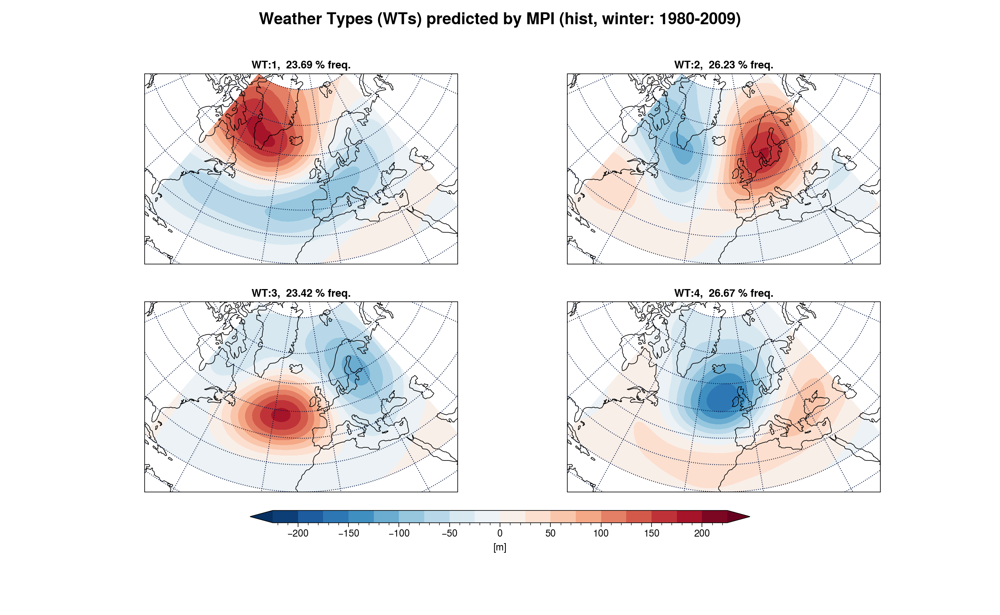

In [63]:
plot_4(list_info, da1, freq_perc1)

In [64]:
m = 'MPI'
case = 'ssp245'

season = 'winter'
yearstart = '2070'
yearend = '2099'

refone = 'F'

In [65]:
rootstore = '/bettik/castelli/data/WTD/'+m+'/'+case+'/1.0degree'

if refone=='T':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
if refone == 'F' and case != 'hist':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')

latin    = os.path.join(rootstore, m+'_lat_1.0_AtlEurSector.npy')
lonin    = os.path.join(rootstore, m+'_lon_1.0_AtlEurSector.npy')

In [66]:
da2 = make_data_array(filein1,latin,lonin)

---> Shape of the centroids are:  (4, 61, 131)


In [67]:
idx = np.load(filein2)

unique_elements, counts_elements = np.unique(idx, return_counts=True)

freq_perc2 = counts_elements/len(idx) * 100

In [49]:
da2[1,:,:]

<xarray.DataArray (lat: 61, lon: 131)>
array([[  4.39431477,   4.661304  ,   4.92624426, ...,   0.56333768,
          0.67373991,   0.79400587],
       [  4.94145727,   5.21558428,   5.50486231, ...,   0.31566855,
          0.43604031,   0.59607559],
       [  5.5093317 ,   5.83541679,   6.15360737, ...,  -0.06158652,
          0.16413344,   0.37873575],
       ...,
       [-27.6502285 , -27.43548965, -27.23832512, ...,  39.4683342 ,
         38.38159561,  37.28954315],
       [-26.4074192 , -26.1700058 , -25.88585281, ...,  34.34183121,
         33.44709778,  32.52972031],
       [-25.04447746, -24.88636208, -24.68987274, ...,  29.07813644,
         28.35140419,  27.5960865 ]])
Coordinates:
    label    int64 1
  * lat      (lat) float64 20.0 21.0 22.0 23.0 24.0 ... 76.0 77.0 78.0 79.0 80.0
  * lon      (lon) float64 -80.0 -79.0 -78.0 -77.0 -76.0 ... 47.0 48.0 49.0 50.0

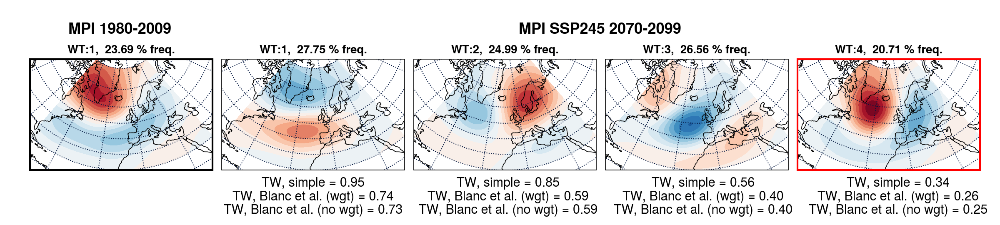

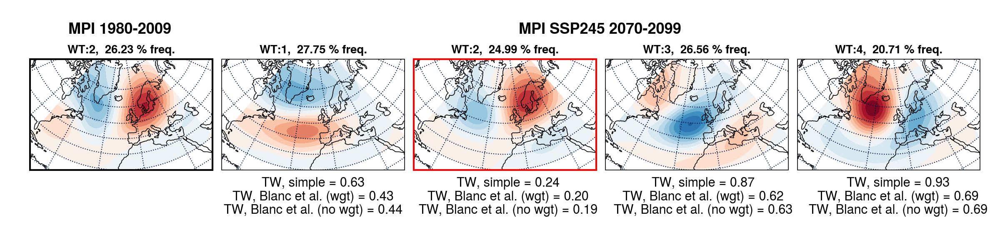

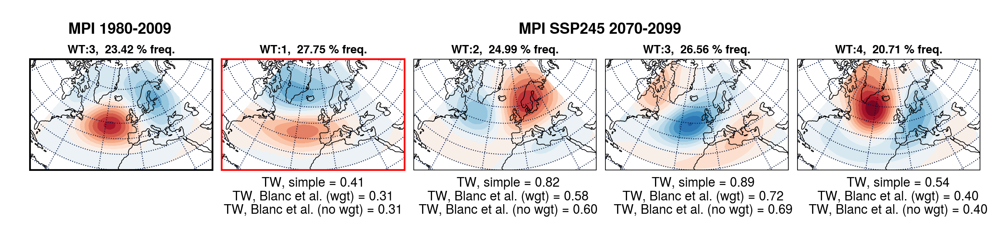

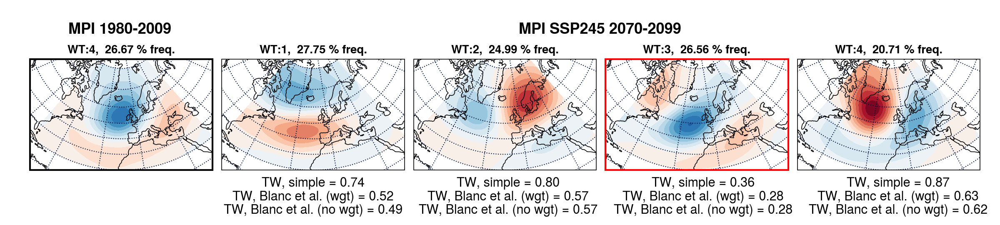

In [145]:
nb_WT = 1
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI 1980-2009', 'MPI SSP245 2070-2099')

nb_WT = 2
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI 1980-2009', 'MPI SSP245 2070-2099')

nb_WT = 3
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI 1980-2009', 'MPI SSP245 2070-2099')

nb_WT = 4
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI 1980-2009', 'MPI SSP245 2070-2099')

In [141]:
TW=np.zeros(4)
TW

array([0., 0., 0., 0.])

### 50 year periods

#### Winter

In [14]:
m = 'MPI'
case = 'hist'

season = 'winter'
yearstart = '1960'
yearend = '2009'

refone = 'T'

list_info = [m, case, season, yearstart, yearend, refone]

In [15]:
rootstore = '/bettik/castelli/data/WTD/'+m+'/'+case+'/1.0degree'

if refone=='T':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
if refone == 'F' and case != 'hist':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')

latin    = os.path.join(rootstore, m+'_lat_1.0_AtlEurSector.npy')
lonin    = os.path.join(rootstore, m+'_lon_1.0_AtlEurSector.npy')

da1 = make_data_array(filein1,latin,lonin)

idx = np.load(filein2)
unique_elements, counts_elements = np.unique(idx, return_counts=True)
freq_perc1 = counts_elements/len(idx) * 100

---> Shape of the centroids are:  (4, 61, 131)


In [150]:
m = 'MPI'
case = 'ssp245'

season = 'winter'
yearstart = '2050'
yearend = '2099'

refone = 'F'

list_info = [m, case, season, yearstart, yearend, refone]

In [151]:
rootstore = '/bettik/castelli/data/WTD/'+m+'/'+case+'/1.0degree'

if refone=='T':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
if refone == 'F' and case != 'hist':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')

latin    = os.path.join(rootstore, m+'_lat_1.0_AtlEurSector.npy')
lonin    = os.path.join(rootstore, m+'_lon_1.0_AtlEurSector.npy')

da2 = make_data_array(filein1,latin,lonin)

idx = np.load(filein2)
unique_elements, counts_elements = np.unique(idx, return_counts=True)
freq_perc2 = counts_elements/len(idx) * 100

---> Shape of the centroids are:  (4, 61, 131)


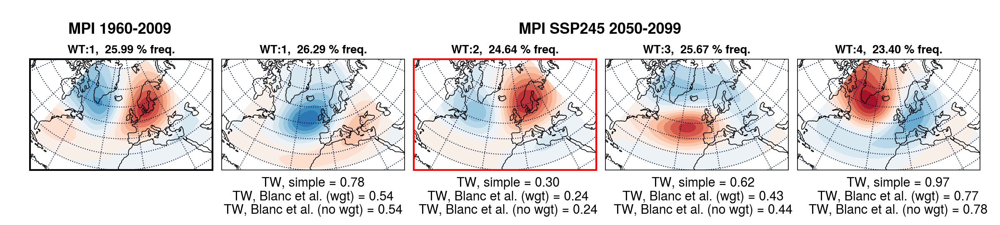

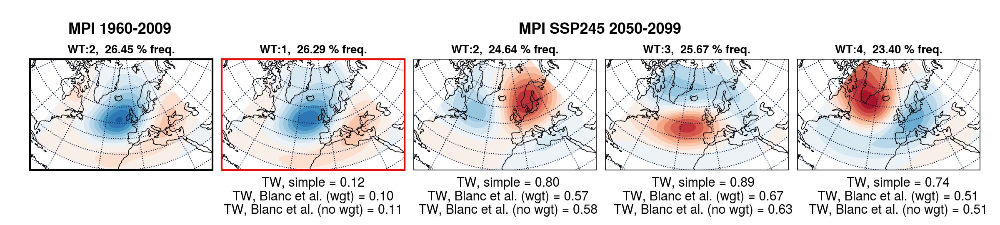

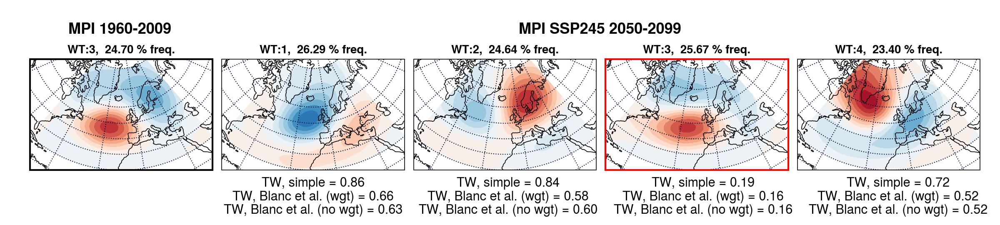

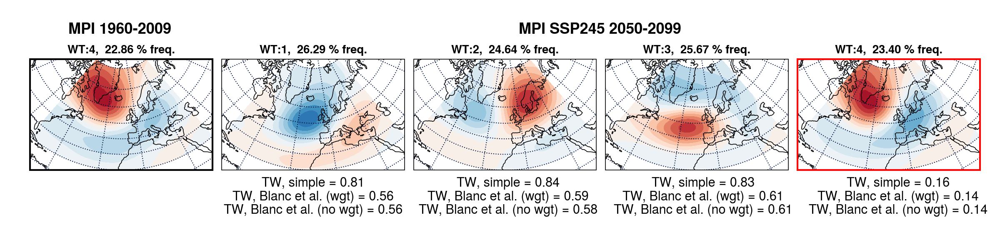

In [152]:
nb_WT = 1
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI 1960-2009', 'MPI SSP245 2050-2099')

nb_WT = 2
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI 1960-2009', 'MPI SSP245 2050-2099')

nb_WT = 3
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI 1960-2009', 'MPI SSP245 2050-2099')

nb_WT = 4
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI 1960-2009', 'MPI SSP245 2050-2099')

#### Summer

In [153]:
m = 'MPI'
case = 'hist'

season = 'summerJJA'
yearstart = '1960'
yearend = '2009'

refone = 'T'

list_info = [m, case, season, yearstart, yearend, refone]

In [154]:
rootstore = '/bettik/castelli/data/WTD/'+m+'/'+case+'/1.0degree'

if refone=='T':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
if refone == 'F' and case != 'hist':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')

latin    = os.path.join(rootstore, m+'_lat_1.0_AtlEurSector.npy')
lonin    = os.path.join(rootstore, m+'_lon_1.0_AtlEurSector.npy')

da1 = make_data_array(filein1,latin,lonin)

idx = np.load(filein2)
unique_elements, counts_elements = np.unique(idx, return_counts=True)
freq_perc1 = counts_elements/len(idx) * 100

---> Shape of the centroids are:  (4, 61, 131)


In [155]:
m = 'MPI'
case = 'ssp245'

season = 'summerJJA'
yearstart = '2050'
yearend = '2099'

refone = 'F'

list_info = [m, case, season, yearstart, yearend, refone]

In [156]:
rootstore = '/bettik/castelli/data/WTD/'+m+'/'+case+'/1.0degree'

if refone=='T':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
if refone == 'F' and case != 'hist':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')

latin    = os.path.join(rootstore, m+'_lat_1.0_AtlEurSector.npy')
lonin    = os.path.join(rootstore, m+'_lon_1.0_AtlEurSector.npy')

da2 = make_data_array(filein1,latin,lonin)

idx = np.load(filein2)
unique_elements, counts_elements = np.unique(idx, return_counts=True)
freq_perc2 = counts_elements/len(idx) * 100

---> Shape of the centroids are:  (4, 61, 131)


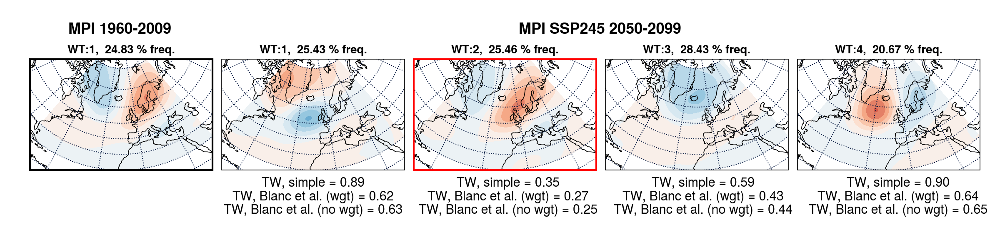

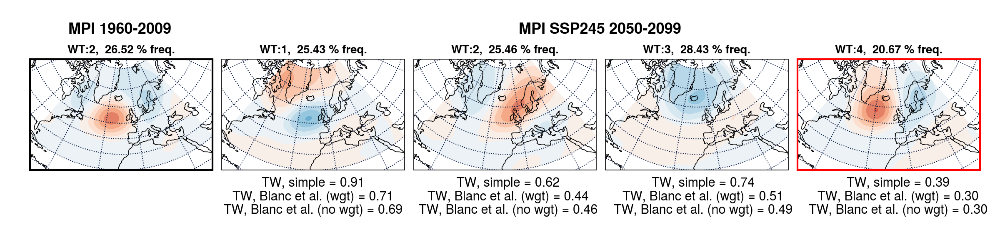

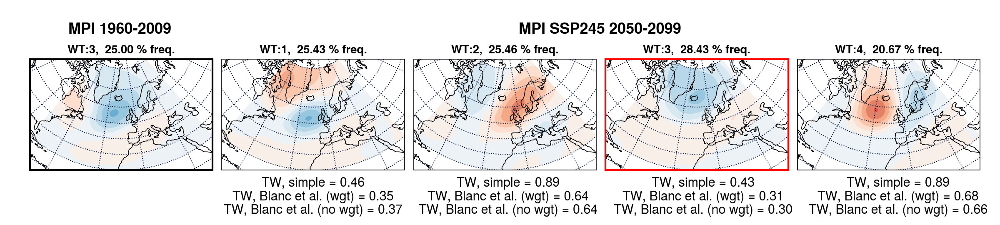

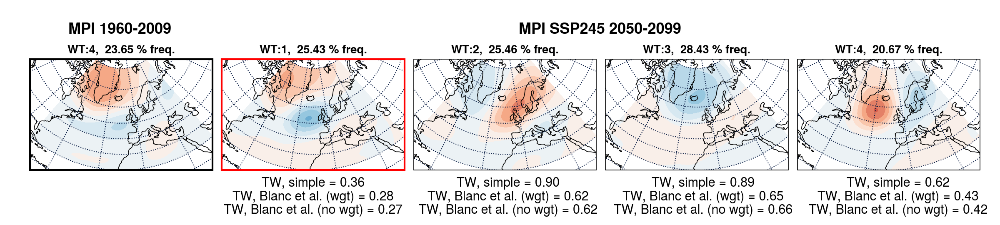

In [157]:
nb_WT = 1
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI 1960-2009', 'MPI SSP245 2050-2099')

nb_WT = 2
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI 1960-2009', 'MPI SSP245 2050-2099')

nb_WT = 3
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI 1960-2009', 'MPI SSP245 2050-2099')

nb_WT = 4
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI 1960-2009', 'MPI SSP245 2050-2099')

#### Winter-Summer

In [16]:
m = 'MPI'
case = 'hist'

season = 'winter'
yearstart = '1960'
yearend = '2009'

refone = 'T'

list_info = [m, case, season, yearstart, yearend, refone]

In [17]:
rootstore = '/bettik/castelli/data/WTD/'+m+'/'+case+'/1.0degree'

if refone=='T':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
if refone == 'F' and case != 'hist':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')

latin    = os.path.join(rootstore, m+'_lat_1.0_AtlEurSector.npy')
lonin    = os.path.join(rootstore, m+'_lon_1.0_AtlEurSector.npy')

da1 = make_data_array(filein1,latin,lonin)

idx = np.load(filein2)
unique_elements, counts_elements = np.unique(idx, return_counts=True)
freq_perc1 = counts_elements/len(idx) * 100

---> Shape of the centroids are:  (4, 61, 131)


In [168]:
m = 'MPI'
case = 'hist'

season = 'summerJJA'
yearstart = '1960'
yearend = '2009'

refone = 'T'

list_info = [m, case, season, yearstart, yearend, refone]

In [169]:
rootstore = '/bettik/castelli/data/WTD/'+m+'/'+case+'/1.0degree'

if refone=='T':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
if refone == 'F' and case != 'hist':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')

latin    = os.path.join(rootstore, m+'_lat_1.0_AtlEurSector.npy')
lonin    = os.path.join(rootstore, m+'_lon_1.0_AtlEurSector.npy')

da2 = make_data_array(filein1,latin,lonin)

idx = np.load(filein2)
unique_elements, counts_elements = np.unique(idx, return_counts=True)
freq_perc2 = counts_elements/len(idx) * 100

---> Shape of the centroids are:  (4, 61, 131)


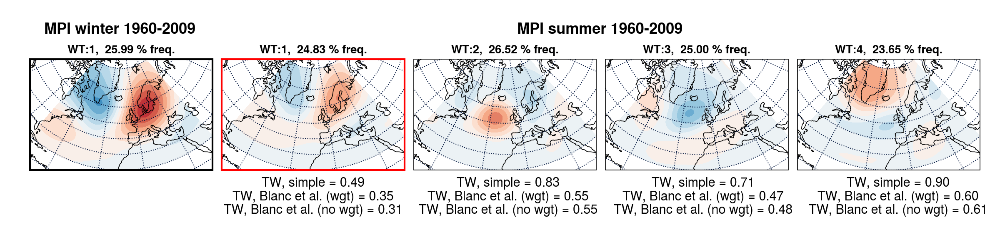

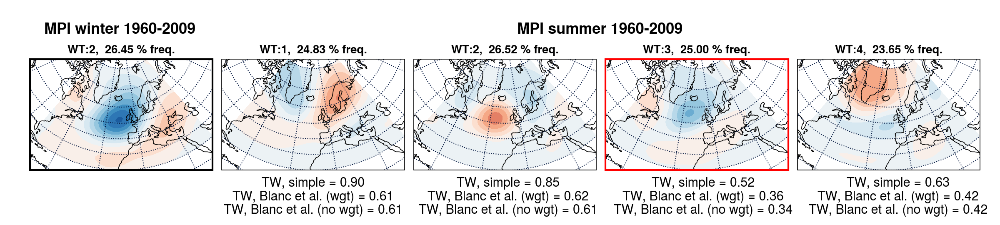

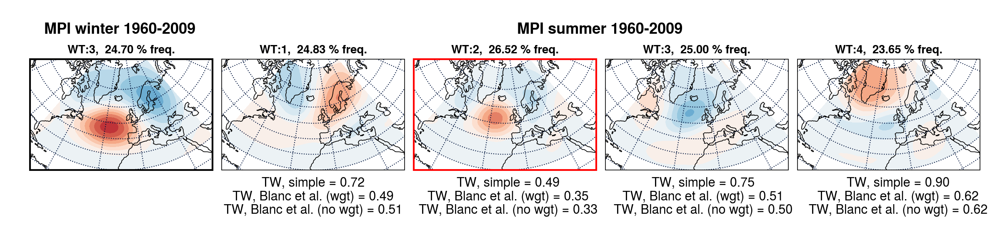

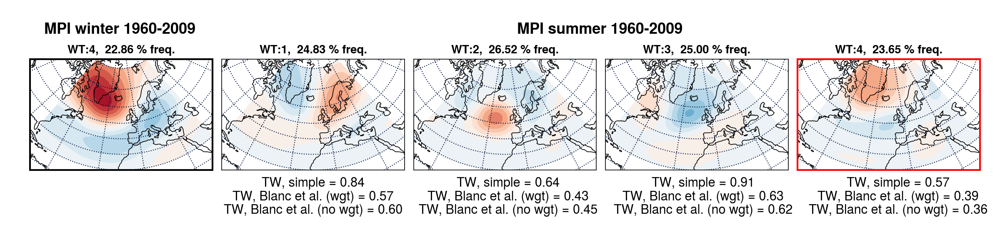

In [170]:
nb_WT = 1
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI winter 1960-2009', 'MPI summer 1960-2009')

nb_WT = 2
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI winter 1960-2009', 'MPI summer 1960-2009')

nb_WT = 3
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI winter 1960-2009', 'MPI summer 1960-2009')

nb_WT = 4
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI winter 1960-2009', 'MPI summer 1960-2009')

#### SSP585 winter

In [18]:
m = 'MPI'
case = 'hist'

season = 'winter'
yearstart = '1960'
yearend = '2009'

refone = 'T'

list_info = [m, case, season, yearstart, yearend, refone]

In [19]:
rootstore = '/bettik/castelli/data/WTD/'+m+'/'+case+'/1.0degree'

if refone=='T':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
if refone == 'F' and case != 'hist':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')

latin    = os.path.join(rootstore, m+'_lat_1.0_AtlEurSector.npy')
lonin    = os.path.join(rootstore, m+'_lon_1.0_AtlEurSector.npy')

da1 = make_data_array(filein1,latin,lonin)

idx = np.load(filein2)
unique_elements, counts_elements = np.unique(idx, return_counts=True)
freq_perc1 = counts_elements/len(idx) * 100

---> Shape of the centroids are:  (4, 61, 131)


In [20]:
m = 'MPI'
case = 'ssp585'

season = 'winter'
yearstart = '2050'
yearend = '2099'

refone = 'F'

list_info = [m, case, season, yearstart, yearend, refone]

In [21]:
rootstore = '/bettik/castelli/data/WTD/'+m+'/'+case+'/1.0degree'

if refone=='T':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'.npy')
if refone == 'F' and case != 'hist':
    filein1  = os.path.join(rootstore, m+'_AtlEurSector_centers_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')
    filein2  = os.path.join(rootstore, m+'_AtlEurSector_labels_1.0_'+season+'_'+yearstart+'-'+yearend+'_bis.npy')

latin    = os.path.join(rootstore, m+'_lat_1.0_AtlEurSector.npy')
lonin    = os.path.join(rootstore, m+'_lon_1.0_AtlEurSector.npy')

da2 = make_data_array(filein1,latin,lonin)

idx = np.load(filein2)
unique_elements, counts_elements = np.unique(idx, return_counts=True)
freq_perc2 = counts_elements/len(idx) * 100

---> Shape of the centroids are:  (4, 61, 131)


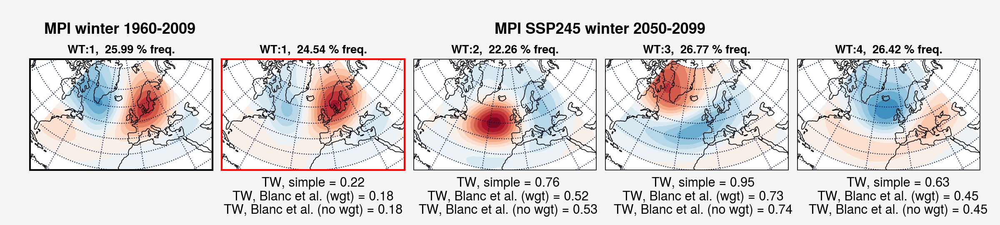

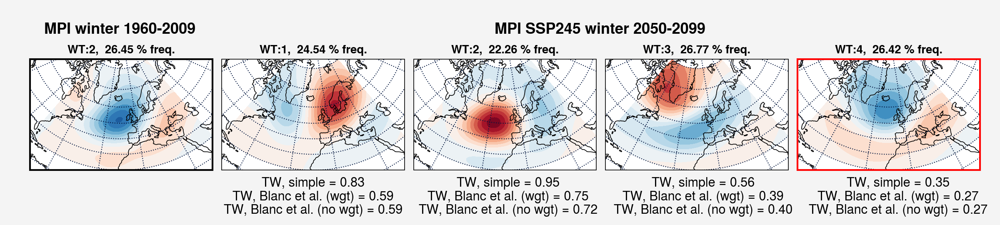

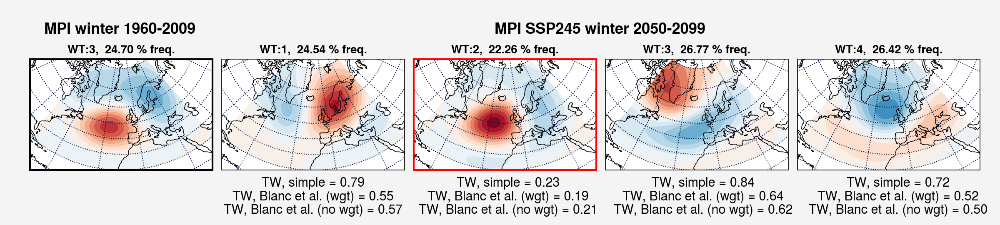

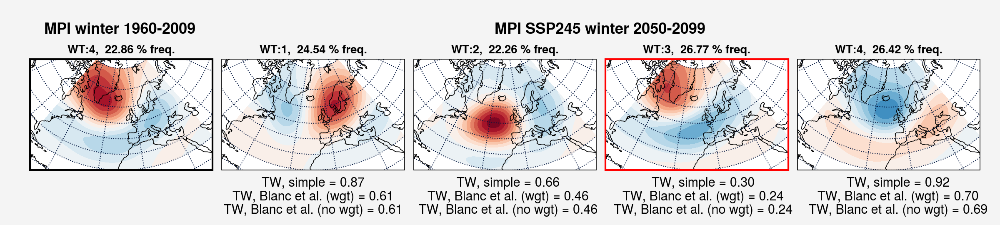

In [24]:
nb_WT = 1
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI winter 1960-2009', 'MPI SSP245 winter 2050-2099')

nb_WT = 2
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI winter 1960-2009', 'MPI SSP245 winter 2050-2099')

nb_WT = 3
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI winter 1960-2009', 'MPI SSP245 winter 2050-2099')

nb_WT = 4
plot_5(da1[nb_WT-1], freq_perc1[nb_WT-1], nb_WT, da2, freq_perc2, 'MPI winter 1960-2009', 'MPI SSP245 winter 2050-2099')

#### SSP585 summerJJA